In [1]:
import os
from scipy.io import loadmat
import matplotlib.pyplot as plt
from astropy.io import fits
import imageio
import numpy as np
import scipy
from scipy import linalg
import imageio.v2 as imageio
from imageio.core import util as imageio_util
import matplotlib.cm as cm
from psf_functions import *
from matplotlib.patches import Rectangle
from datetime import datetime, timedelta
from psf_functions import encircled_energy_in_3x3
from scipy.ndimage import center_of_mass
import pandas as pd
import re

folder_data = '/Volumes/SanDisk/PAPYRUS_run2/30.09.25/record/2025-10-01_06-58-49'

%matplotlib inline

# Data

In [2]:
# --------------------------------------------------------------------
# MANUAL LIST OF FOLDERS
# --------------------------------------------------------------------
"""
folders = [
    # 30.09.25
    '/Volumes/SanDisk/PAPYRUS_run2/30.09.25/record/2025-10-01_06-58-49',  # 3s
    '/Volumes/SanDisk/PAPYRUS_run2/30.09.25/record/2025-10-01_06-59-09',  # 4s
    '/Volumes/SanDisk/PAPYRUS_run2/30.09.25/record/2025-10-01_07-10-33',  # 3s
    '/Volumes/SanDisk/PAPYRUS_run2/30.09.25/record/2025-10-01_07-10-46',  # 4s

    # 01.10.25
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-27-19',# 3s
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-30-43',
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-12-37',# 3s
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-13-19',
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-10-56',# 3s
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-11-10',
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-49-11',# 3s
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-48-31',
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-27-34',# 3s
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-27-46',
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-32-36',# 3s
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-32-58',
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-33-47',# 3s
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-34-00',
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-36-37',# 3s
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-36-51',
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-37-57',# 3s
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-38-21',

    # 02.10.25
    '/Volumes/SanDisk/PAPYRUS_run2/02.10.25/record/2025-10-03_00-23-57',# 3s
    '/Volumes/SanDisk/PAPYRUS_run2/02.10.25/record/2025-10-03_00-24-16',
    '/Volumes/SanDisk/PAPYRUS_run2/02.10.25/record/2025-10-03_00-46-36',# 3s
    '/Volumes/SanDisk/PAPYRUS_run2/02.10.25/record/2025-10-03_00-46-45',
    #'/Volumes/SanDisk/PAPYRUS_run2/02.10.25/record/2025-10-03_00-48-14',
    #'/Volumes/SanDisk/PAPYRUS_run2/02.10.25/record/2025-10-03_00-48-46',
]
"""


folders = [
    # 30.09.25
    #'/Volumes/SanDisk/PAPYRUS_run2/30.09.25/record/2025-10-01_06-58-49',  # 3s #psf saturated
    #'/Volumes/SanDisk/PAPYRUS_run2/30.09.25/record/2025-10-01_06-59-09',  # 4s
    #'/Volumes/SanDisk/PAPYRUS_run2/30.09.25/record/2025-10-01_07-10-33',  # 3s
    #'/Volumes/SanDisk/PAPYRUS_run2/30.09.25/record/2025-10-01_07-10-46',  # 4s
    #'/Volumes/SanDisk/PAPYRUS_run2/30.09.25/record/2025-10-01_07-11-15',  # 3s
    #'/Volumes/SanDisk/PAPYRUS_run2/30.09.25/record/2025-10-01_07-11-31',  # 4s

    # 01.10.25
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-27-34',# 3s
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-27-46',
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-32-36',# 3s
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-32-58',
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-33-47',# 3s
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-34-00',
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-36-37',# 3s 500hz
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-36-51',
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-37-57',# 3s 500hz
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-38-21',
    #'/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-44-30',# 3s between dd4ao tests, strange behaviour
    #'/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-45-43',
    #'/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-49-11',# 3s
    #'/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-48-31',
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-10-56',# 3s
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-11-10',
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-12-37',# 3s
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-13-19',
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-27-19',# 3s
    '/Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-30-43',


    # 02.10.25
    '/Volumes/SanDisk/PAPYRUS_run2/02.10.25/record/2025-10-03_00-46-36',# 3s
    '/Volumes/SanDisk/PAPYRUS_run2/02.10.25/record/2025-10-03_00-46-45',
    '/Volumes/SanDisk/PAPYRUS_run2/02.10.25/record/2025-10-03_00-48-14',# 3s
    '/Volumes/SanDisk/PAPYRUS_run2/02.10.25/record/2025-10-03_00-48-46',

]


# --------------------------------------------------------------------
# Crop coords per date
# --------------------------------------------------------------------
crop_coords = {
    '30.09.25': dict(x0=275, x1=375, y0=220, y1=320),
    '01.10.25': dict(x0=225, x1=425, y0=200, y1=400),
    '02.10.25': dict(x0=285, x1=385, y0=220, y1=320),
}



In [3]:
# --------------------------------------------------------------------
# Helper functions
# --------------------------------------------------------------------
def get_pyramid_type(path):
    idx = folders.index(path)
    return '3s' if idx % 2 == 0 else '4s'
    
def get_time_from_path(path):
    m = re.search(r'_(\d{2}-\d{2}-\d{2})$', path)
    return m.group(1) if m else None

def get_date_from_path(path):
    m = re.search(r"/(\d{2}\.\d{2}\.\d{2})/", path)
    return m.group(1) if m else None

def get_datetime_from_path(path):
    m = re.search(r'(\d{4}-\d{2}-\d{2})_(\d{2}-\d{2}-\d{2})', path)
    if not m:
        return None
    return datetime.strptime(m.group(0), '%Y-%m-%d_%H-%M-%S')

def compute_encircled_energy(folder_path):
    date_str = get_date_from_path(folder_path)
    coords = crop_coords.get(date_str)

    cube = fits.getdata(os.path.join(folder_path, 'cred2.fits')).astype(float)
    psf_data = cube[:, coords['y0']:coords['y1'], coords['x0']:coords['x1']]
    psf = np.var(psf_data, axis=0)
    median_level = np.median(psf[:, 0:30])
    psf = psf - median_level
    psf_norm = psf / psf.sum()

    y_com, x_com = center_of_mass(psf_norm)
    y_peak, x_peak = np.unravel_index(np.argmax(psf_norm), psf_norm.shape)
    ee = encircled_energy_in_3x3(psf_norm, x_peak, y_peak)

    # Inline PSF plot (optional)
    fig, ax = plt.subplots(figsize=(5, 5))
    im = ax.imshow(np.log10(np.clip(psf_norm, 1e-8, None)), origin='lower', cmap='inferno')
    ax.scatter(x_peak, y_peak, color='cyan', marker='x', s=80, label=f'Peak ({x_peak:.1f}, {y_peak:.1f})')
    ax.scatter(x_com, y_com, color='lime', marker='+', s=80, label=f'CoM ({x_com:.2f}, {y_com:.2f})')
    ax.set_title(f"{get_pyramid_type(folder_path)} | {date_str} | EE={ee:.4f}")
    ax.legend(fontsize=8)
    plt.colorbar(im, ax=ax, label='log10(norm intensity)')
    plt.tight_layout()
    plt.show()

    return {
        'folder': folder_path,
        'datetime': get_datetime_from_path(folder_path),   # <-- replaced
        'pyramid': get_pyramid_type(folder_path),
        'EE': ee,
    }


def compute_fwhm(folder_path):

    date_str = get_date_from_path(folder_path)
    coords = crop_coords.get(date_str)

    # --- Load cube and extract PSF ---
    cube = fits.getdata(os.path.join(folder_path, 'cred2.fits')).astype(float)
    psf_data = cube[:, coords['y0']:coords['y1'], coords['x0']:coords['x1']]
    psf = np.var(psf_data, axis=0)

    # Normalize
    psf_norm = psf / psf.sum()

    # --- Encircled Energy (3×3) ---
    y_peak, x_peak = np.unravel_index(np.argmax(psf_norm), psf_norm.shape)
    ee = encircled_energy_in_3x3(psf_norm, x_peak, y_peak)

    # --- Fit asymmetric 2D Gaussian ---
    try:
        (fwhm_x, fwhm_y, fwhm_geom), popt, model = fit_fwhm_2d(psf_norm)
    except Exception as e:
        print(f"⚠️ FWHM fit failed for {folder_path}: {e}")
        return {
            'folder': folder_path,
            'datetime': get_datetime_from_path(folder_path),
            'FWHM_x': np.nan,
            'FWHM_y': np.nan,
            'FWHM_geom': np.nan,
            'EE': ee,
        }

    # --- Compute residuals ---
    residuals = psf_norm - model

    # --- 3-panel plot: data | model | residuals ---
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))

    # Panel 1: PSF data
    im0 = axes[0].imshow(np.log10(psf_norm), origin="lower", cmap="inferno")
    axes[0].set_title("PSF data")
    plt.colorbar(im0, ax=axes[0])

    # Panel 2: Gaussian fit
    im1 = axes[1].imshow(np.log10(model), origin="lower", cmap="inferno")
    axes[1].set_title("Gaussian fit")
    plt.colorbar(im1, ax=axes[1])

    # Panel 3: Residuals
    vmax = np.nanmax(np.abs(residuals))
    im2 = axes[2].imshow(
        residuals,
        origin="lower",
        cmap="RdBu_r",
        vmin=-vmax,
        vmax=vmax
    )
    axes[2].set_title("Residuals")
    plt.colorbar(im2, ax=axes[2])

    fig.suptitle(
        f"{os.path.basename(folder_path)}\n"
        f"fwhm_x, fwhm_y = {fwhm_x:.2f}, {fwhm_y:.2f}px | FWHM = {fwhm_geom:.2f} px | EE = {ee:.4f}",
        fontsize=13
    )

    plt.tight_layout()
    plt.show()

    # --- Return values ---
    return {
        'folder': folder_path,
        'datetime': get_datetime_from_path(folder_path),
        'pyramid': get_pyramid_type(folder_path),   # <-- ADDED BACK
        'EE': ee,
        'FWHM_x': fwhm_x,
        'FWHM_y': fwhm_y,
        'FWHM_geom': fwhm_geom,
    }



def compute_modes_rms_kl(modes):
    """Compute RMS per mode along time axis."""
    return np.sqrt(np.mean(modes**2, axis=0))

def compute_rms_for_pyramid(pyramid_type):
    """Compute RMS of first 100 KL modes for all folders of given pyramid type."""
    rms_in_vals, rms_out_vals, obs_labels = [], [], []

    for folder in folders:
        if get_pyramid_type(folder) != pyramid_type:
            continue
        try:
            modes_in = fits.getdata(os.path.join(folder, 'modes_in.fits'))
            modes_out = fits.getdata(os.path.join(folder, 'modes_out.fits'))

            rms_modes_in_kl = compute_modes_rms_kl(modes_in)
            rms_modes_out_kl = compute_modes_rms_kl(modes_out)

            # Average RMS for first 100 modes
            rms_in_100 = np.sqrt(np.mean(rms_modes_in_kl[:100]**2))
            rms_out_100 = np.sqrt(np.mean(rms_modes_out_kl[:100]**2))

            rms_in_vals.append(rms_in_100)
            rms_out_vals.append(rms_out_100)
            obs_labels.append(os.path.basename(folder))

        except Exception as e:
            print(f"⚠️ Error in {folder}: {e}")

    return rms_in_vals, rms_out_vals, obs_labels




def build_compressed_timeline(df,
                              tiny_gap=timedelta(seconds=30),
                              short_gap=timedelta(minutes=5),
                              medium_gap=timedelta(hours=3),
                              short_offset=timedelta(minutes=5),
                              medium_offset=timedelta(minutes=10),
                              daytime_offset=timedelta(minutes=20)):
    """
    Build a compressed timeline for observations based on temporal gaps.
    
    Parameters
    ----------
    df : DataFrame
        Must contain a sorted 'datetime' column.
    tiny_gap : timedelta
        Gaps smaller than this keep their original delta.
    short_gap : timedelta
        Gaps smaller than this get mapped to short_offset.
    medium_gap : timedelta
        Gaps smaller than this get mapped to medium_offset.
    short_offset, medium_offset, daytime_offset : timedelta
        Fixed offsets applied depending on gap size.

    Returns
    -------
    compressed_times : list of datetime
        The compressed timeline.
    """

    compressed_times = [df['datetime'].iloc[0]]

    for i in range(1, len(df)):
        delta = df['datetime'].iloc[i] - df['datetime'].iloc[i - 1]

        if delta <= tiny_gap:
            new_time = compressed_times[-1] + delta
        elif delta <= short_gap:
            new_time = compressed_times[-1] + short_offset
        elif delta <= medium_gap:
            new_time = compressed_times[-1] + medium_offset
        else:
            new_time = compressed_times[-1] + daytime_offset

        compressed_times.append(new_time)

    return compressed_times


## Encircled energy


→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-27-34


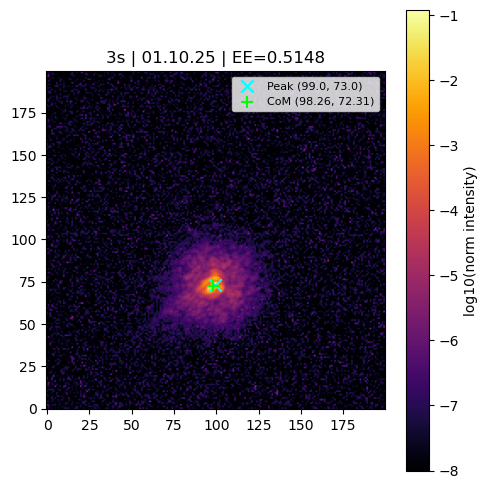


→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-27-46


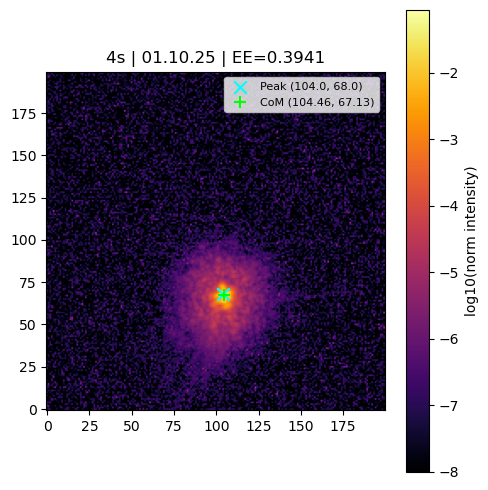


→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-32-36


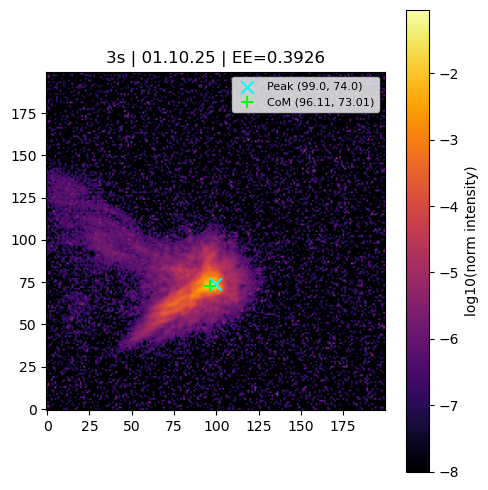


→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-32-58


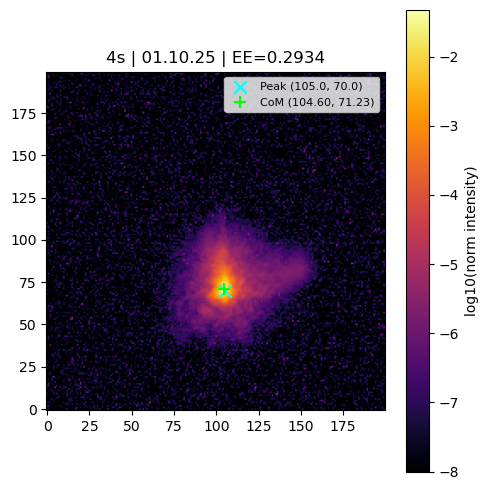


→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-33-47


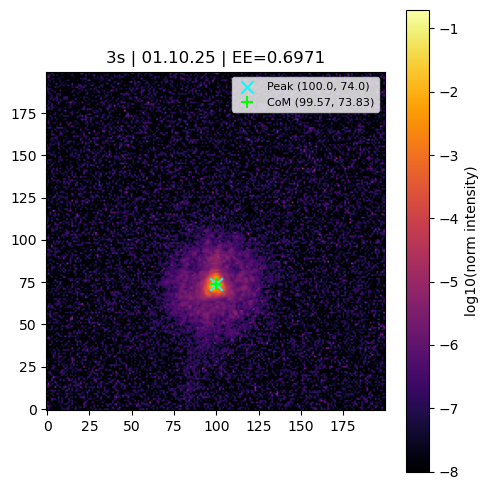


→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-34-00


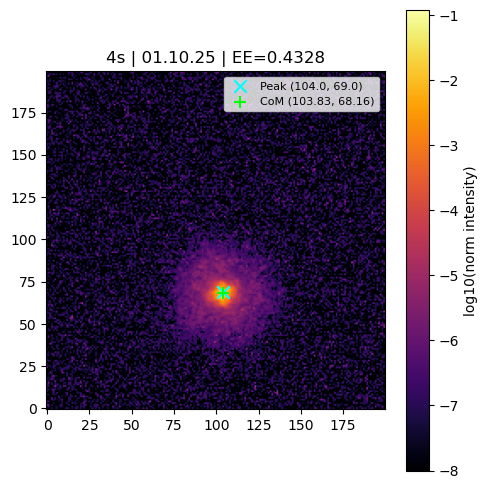


→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-36-37


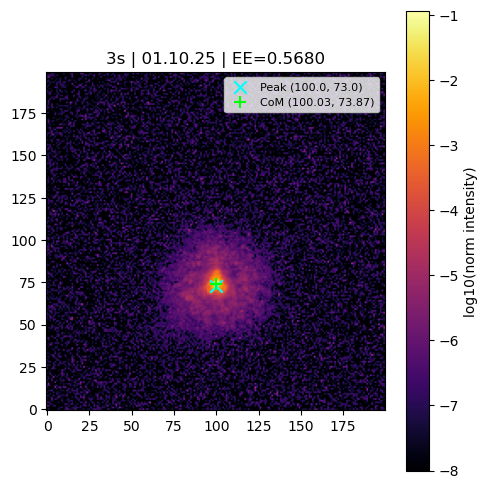


→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-36-51


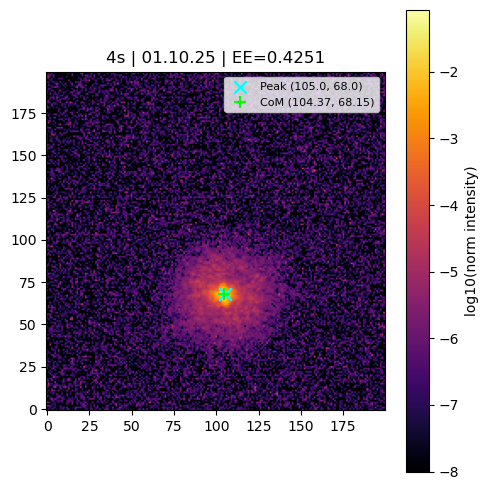


→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-37-57


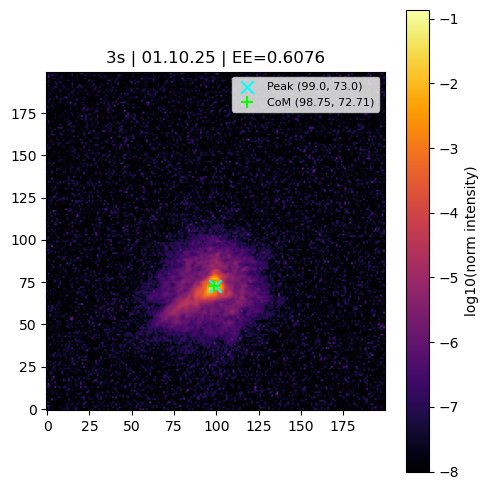


→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-38-21


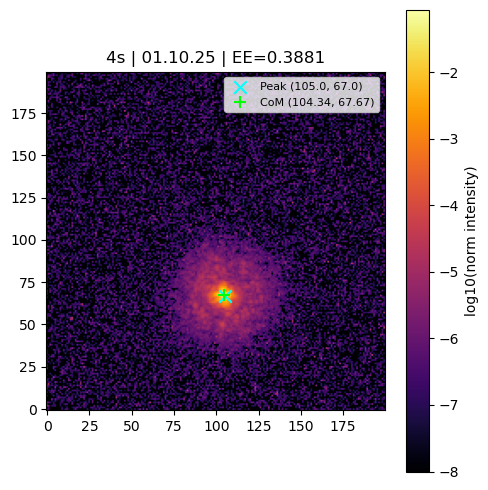


→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-10-56


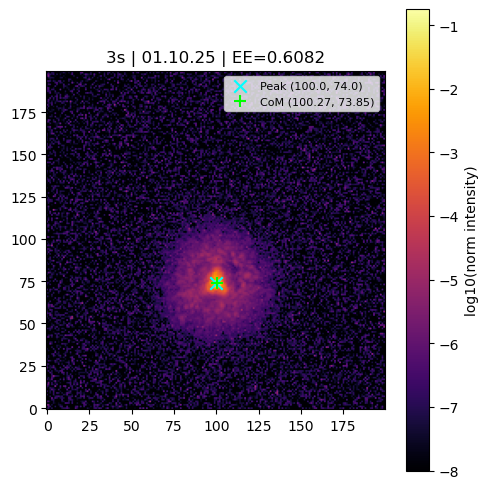


→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-11-10


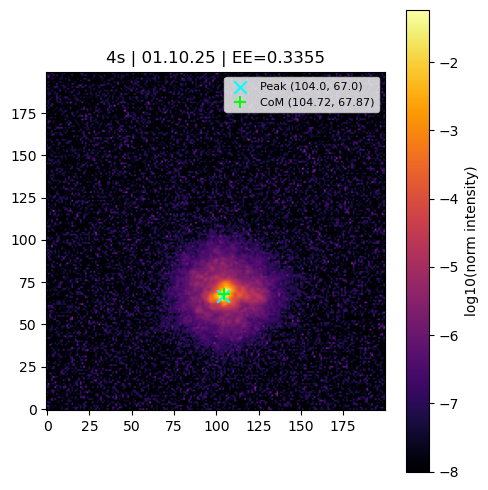


→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-12-37


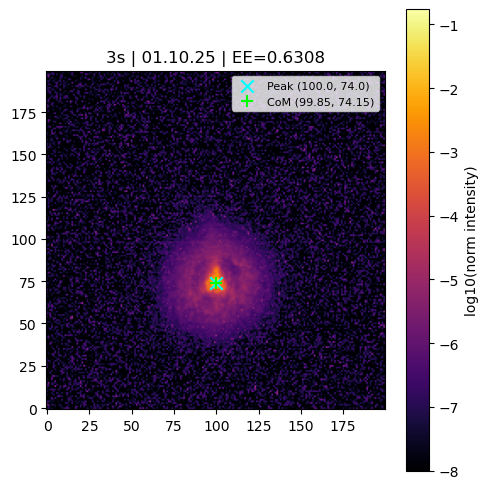


→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-13-19


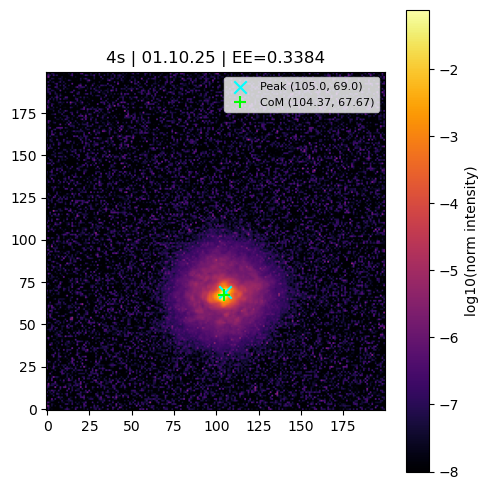


→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-27-19


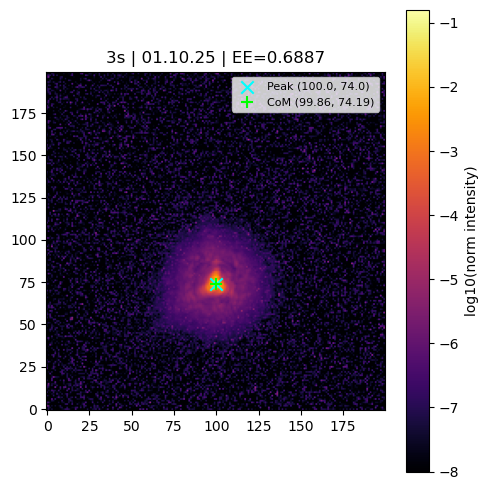


→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-30-43


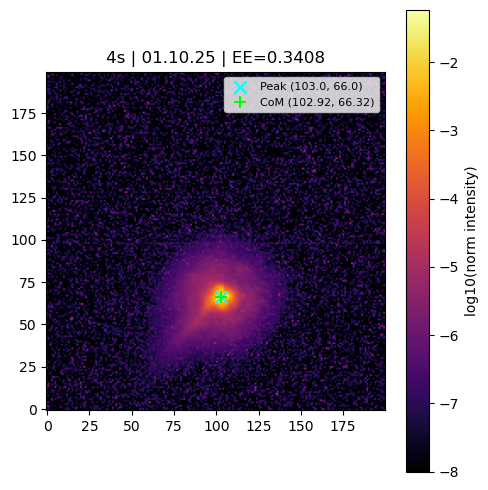


→ Processing /Volumes/SanDisk/PAPYRUS_run2/02.10.25/record/2025-10-03_00-46-36


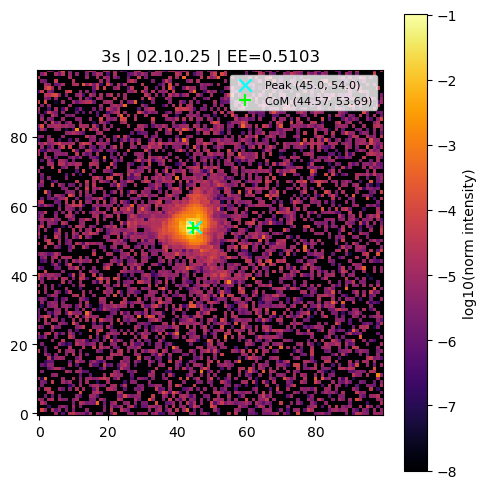


→ Processing /Volumes/SanDisk/PAPYRUS_run2/02.10.25/record/2025-10-03_00-46-45


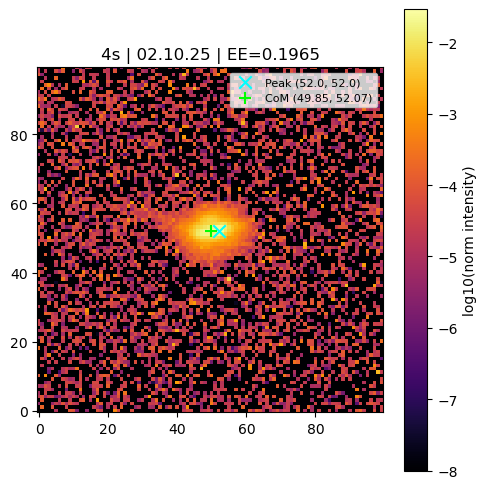


→ Processing /Volumes/SanDisk/PAPYRUS_run2/02.10.25/record/2025-10-03_00-48-14


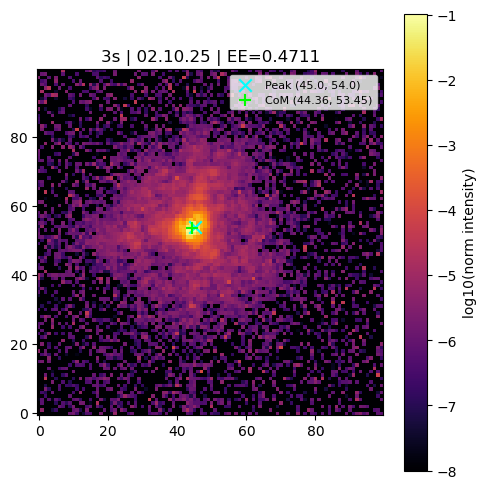


→ Processing /Volumes/SanDisk/PAPYRUS_run2/02.10.25/record/2025-10-03_00-48-46


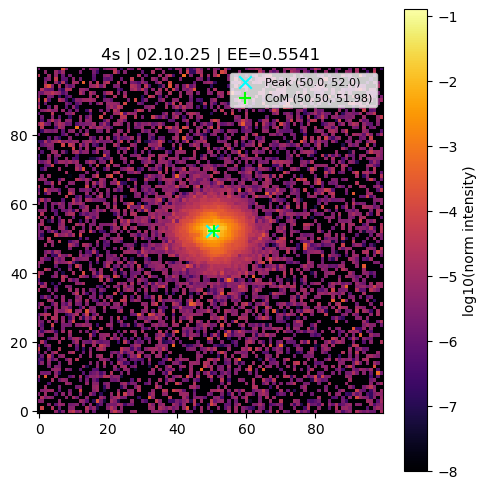

In [4]:

# --------------------------------------------------------------------
# Run on all folders
# --------------------------------------------------------------------
results = []
for f in folders:
    try:
        print(f"\n→ Processing {f}")
        res = compute_encircled_energy(f)
        if res:
            results.append(res)
    except Exception as e:
        print(f"❌ Error in {f}: {e}")




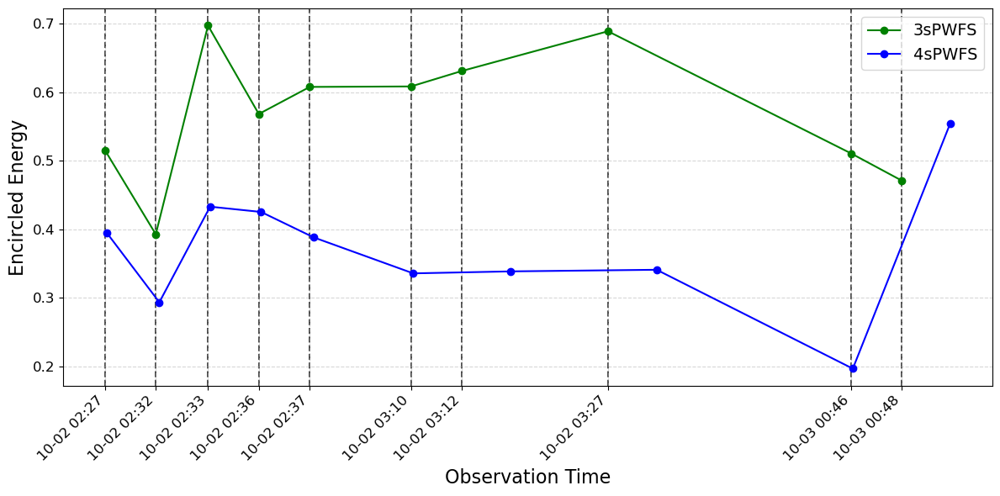

In [5]:

# --------------------------------------------------------------------
# Build compressed timeline 
# --------------------------------------------------------------------
df_EE = pd.DataFrame(results).sort_values('datetime').reset_index(drop=True)
df_EE['pair_index'] = np.floor(df_EE.index / 2).astype(int) + 1
df_EE['compressed_time'] = build_compressed_timeline(df_EE)

# --- Tick labels (real datetimes from 3s PWFS frames) ---
tick_locs = df_EE[df_EE['pyramid'] == '3s']['compressed_time']
tick_labels = [
    dt.strftime('%m-%d %H:%M') 
    for dt in df_EE[df_EE['pyramid'] == '3s']['datetime']
]

# --- Plot ---
plt.figure(figsize=(12, 6))

# Custom colors
colors = {'3s': 'green',
          '4s': 'blue'}

# Plot data
for pyr in ['3s', '4s']:
    sub = df_EE[df_EE['pyramid'] == pyr]
    plt.plot(sub['compressed_time'], sub['EE'], 'o-', 
             label=f'{pyr}PWFS', color=colors[pyr])

# --- Add dark vertical guide lines only for 3s observations ---
for x in df_EE[df_EE['pyramid'] == '3s']['compressed_time']:
    plt.axvline(x, color='#333333', linestyle='--', 
                alpha=0.9, linewidth=1.4, zorder=0)

# --- Aesthetics ---
plt.xlabel('Observation Time', fontsize=16)
plt.ylabel('Encircled Energy', fontsize=16)
plt.grid(True, ls='--', alpha=0.5)
plt.legend(fontsize=14, loc='upper right')

plt.xticks(tick_locs, tick_labels, rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()
plt.savefig("EE_VS_TIME_3S_LINES_new.png", dpi=300, transparent=True)
plt.show()


# FWHM

→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-27-34


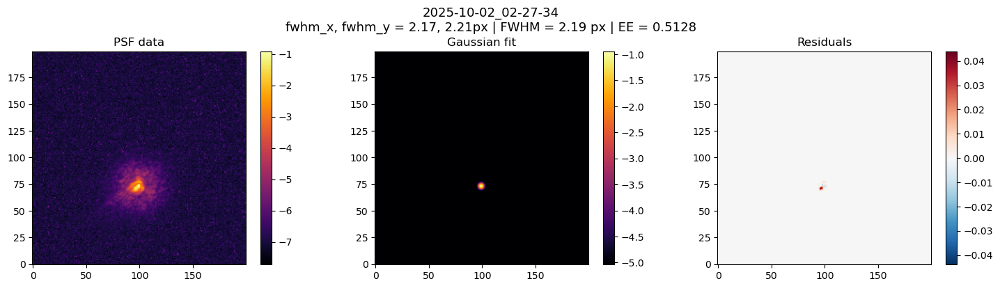

→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-27-46


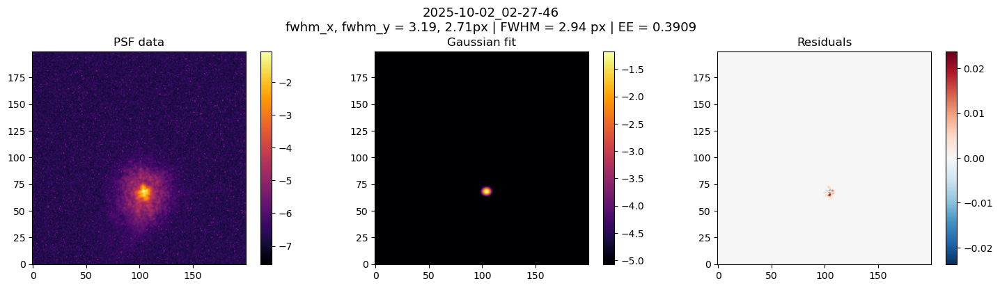

→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-32-36


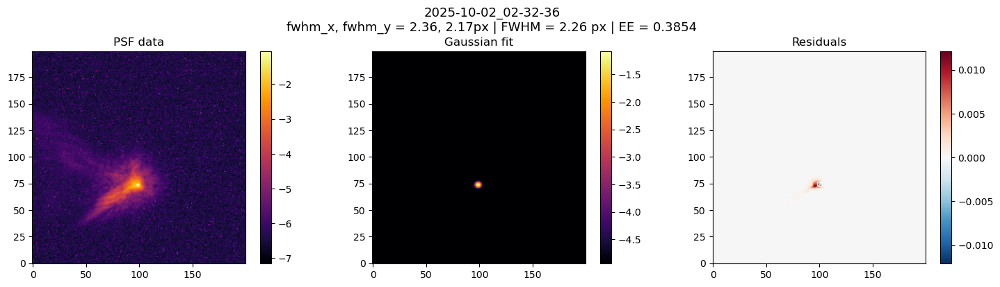

→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-32-58


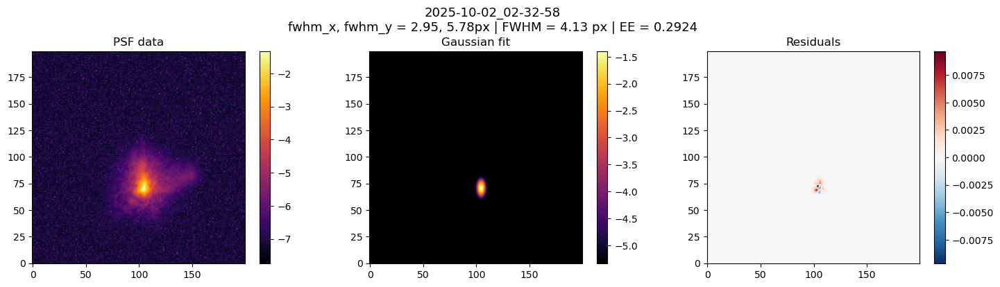

→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-33-47


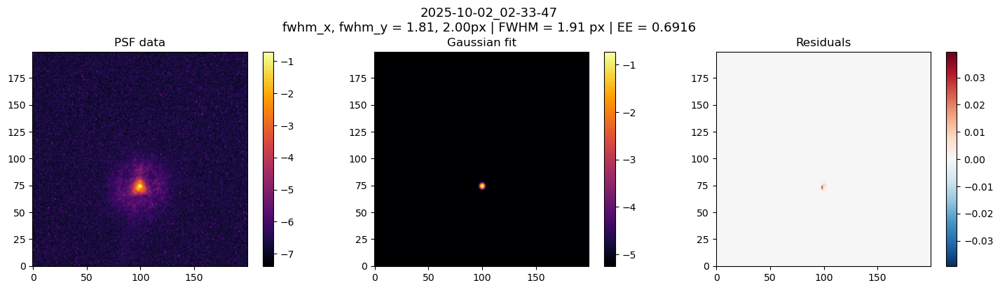

→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-34-00


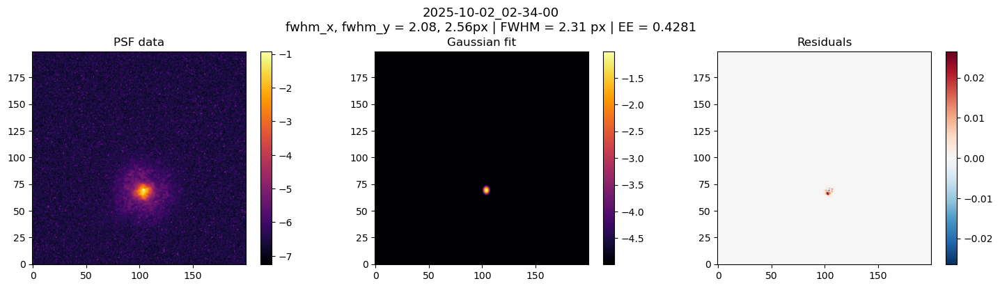

→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-36-37


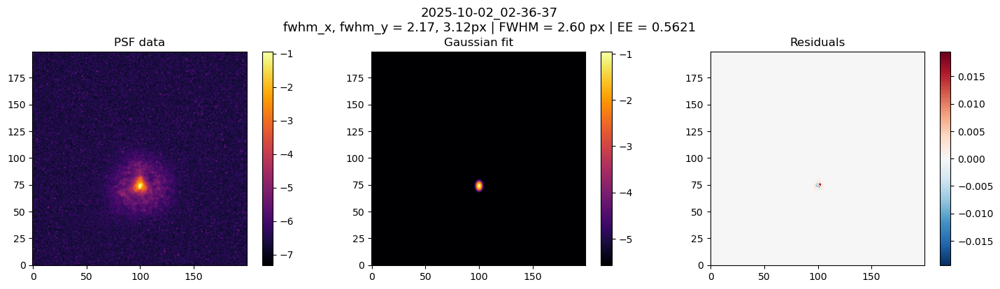

→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-36-51


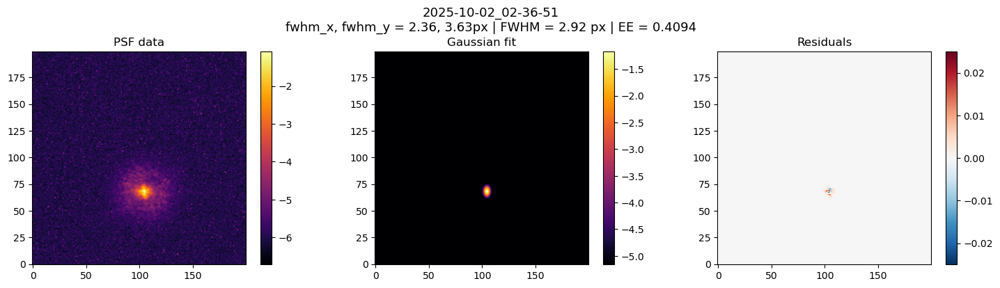

→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-37-57


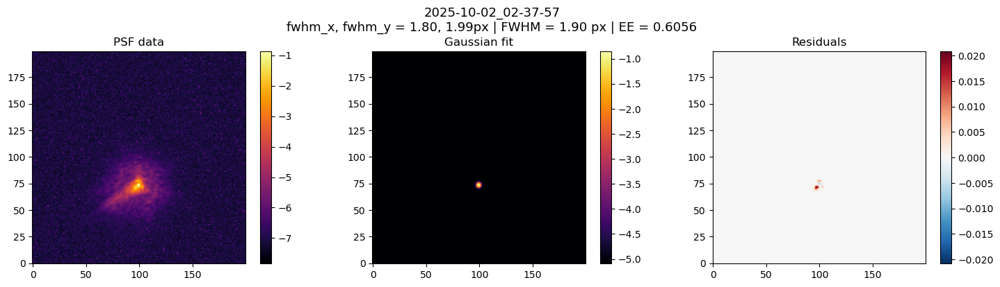

→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_02-38-21


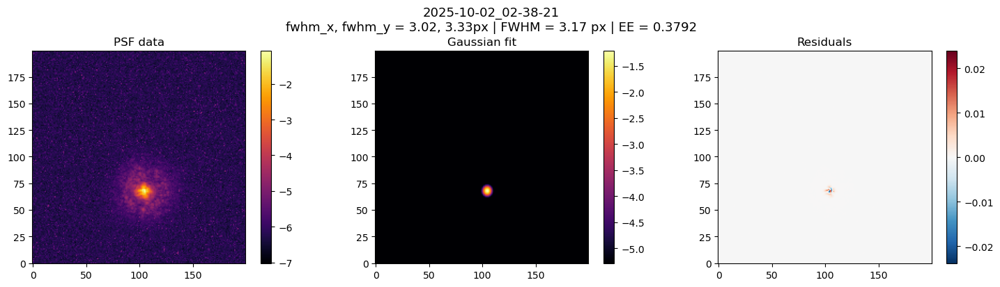

→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-10-56


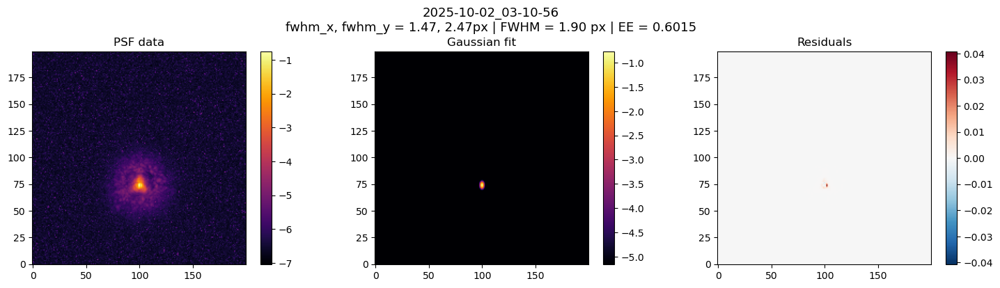

→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-11-10


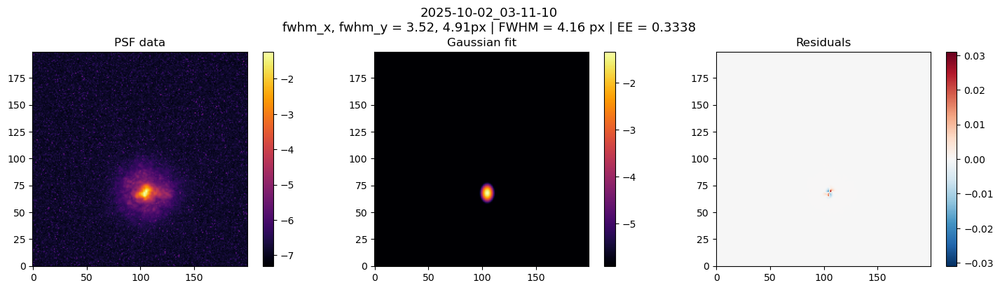

→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-12-37


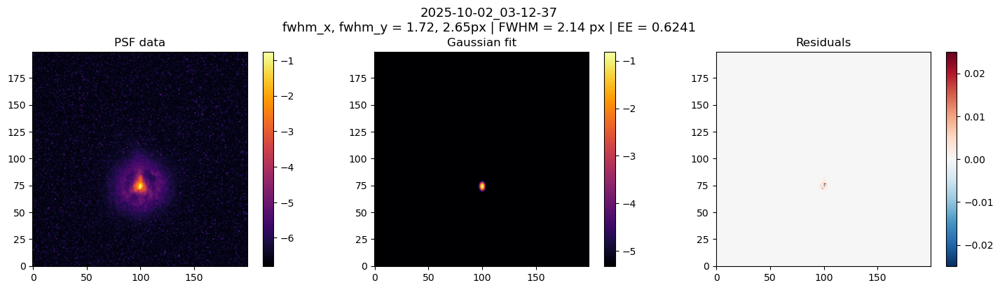

→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-13-19


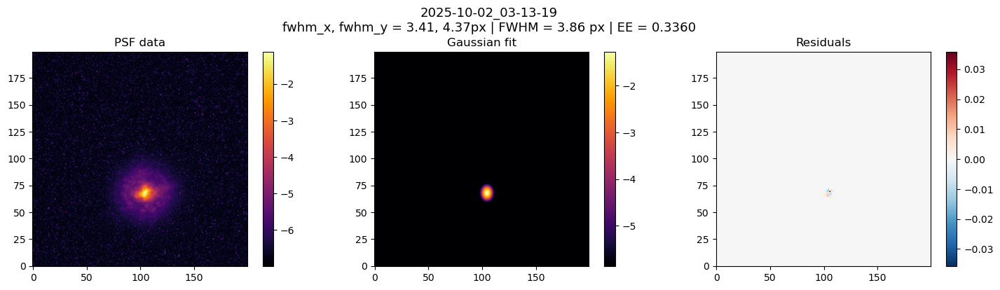

→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-27-19


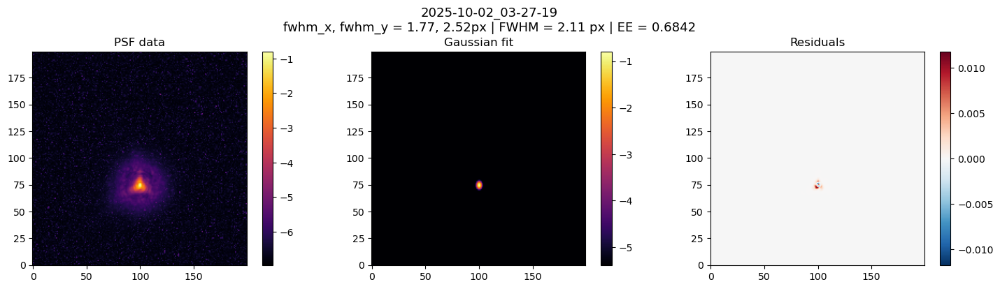

→ Processing /Volumes/SanDisk/PAPYRUS_run2/01.10.25/record/2025-10-02_03-30-43


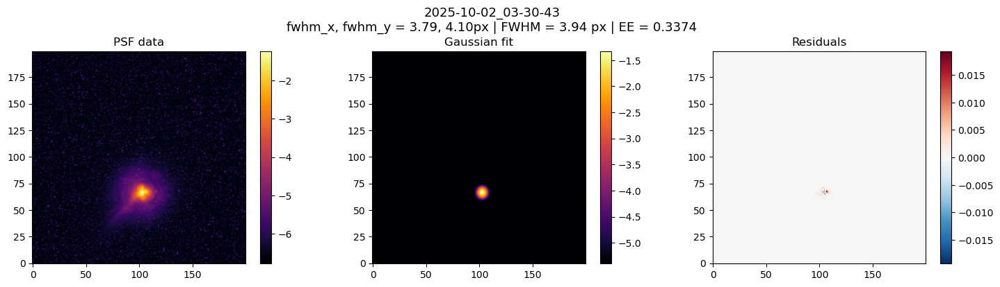

→ Processing /Volumes/SanDisk/PAPYRUS_run2/02.10.25/record/2025-10-03_00-46-36


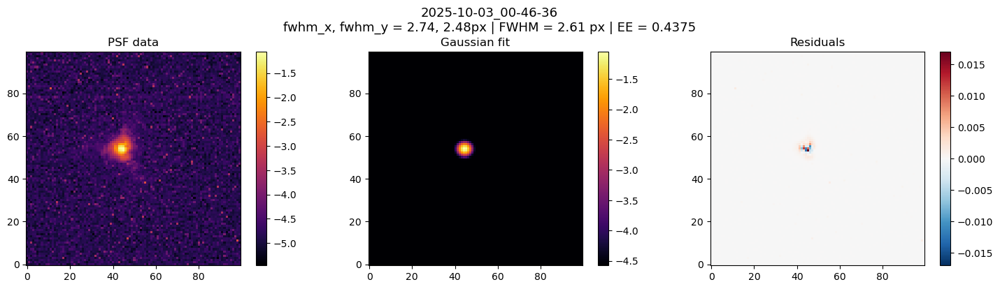

→ Processing /Volumes/SanDisk/PAPYRUS_run2/02.10.25/record/2025-10-03_00-46-45


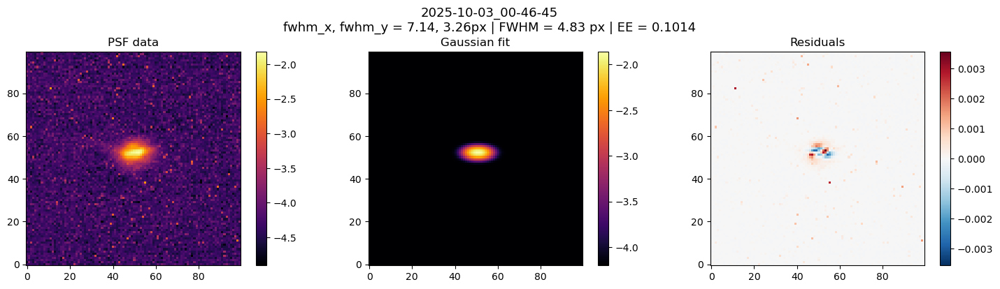

→ Processing /Volumes/SanDisk/PAPYRUS_run2/02.10.25/record/2025-10-03_00-48-14


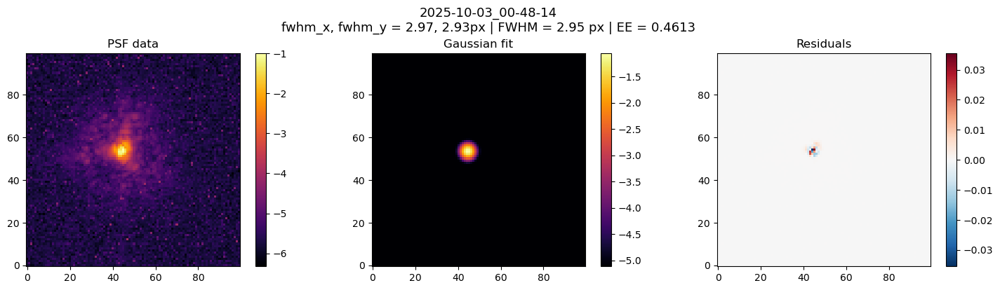

→ Processing /Volumes/SanDisk/PAPYRUS_run2/02.10.25/record/2025-10-03_00-48-46


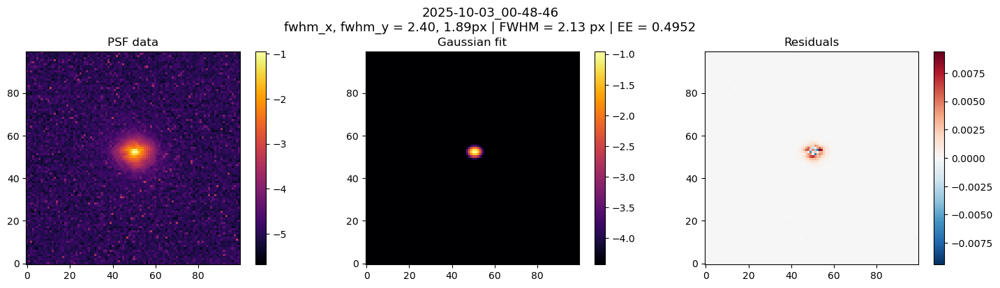

In [6]:
results_fwhm = []

for f in folders:
    print("→ Processing", f)
    res = compute_fwhm(f)     # <-- IMPORTANT
    results_fwhm.append(res)


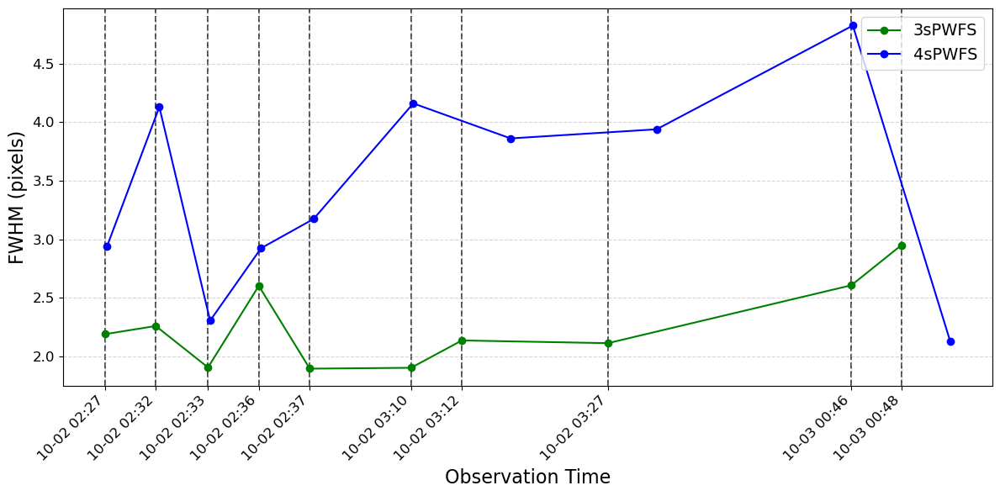

In [7]:
# --------------------------------------------------------------------
# Build compressed timeline for FWHM
# --------------------------------------------------------------------
df_fwhm = pd.DataFrame(results_fwhm).sort_values('datetime').reset_index(drop=True)
df_fwhm['pair_index'] = np.floor(df_fwhm.index / 2).astype(int) + 1
df_fwhm['compressed_time'] = build_compressed_timeline(df_fwhm)

# --- Tick labels (real datetimes from 3s PWFS frames) ---
tick_locs_fwhm = df_fwhm[df_fwhm['pyramid'] == '3s']['compressed_time']
tick_labels_fwhm = [
    dt.strftime('%m-%d %H:%M') 
    for dt in df_fwhm[df_fwhm['pyramid'] == '3s']['datetime']
]

# --- Plot ---
plt.figure(figsize=(12, 6))

# Custom colors
colors = {'3s': 'green',
          '4s': 'blue'}

# Plot data
for pyr in ['3s', '4s']:
    sub = df_fwhm[df_fwhm['pyramid'] == pyr]
    plt.plot(sub['compressed_time'], sub['FWHM_geom'], 'o-', 
             label=f'{pyr}PWFS', color=colors[pyr])

# --- Add dark vertical guide lines only for 3s observations ---
for x in df_fwhm[df_fwhm['pyramid'] == '3s']['compressed_time']:
    plt.axvline(x, color='#333333', linestyle='--', 
                alpha=0.9, linewidth=1.4, zorder=0)

# --- Aesthetics ---
plt.xlabel('Observation Time', fontsize=16)
plt.ylabel('FWHM (pixels)', fontsize=16)
plt.grid(True, ls='--', alpha=0.5)
plt.legend(fontsize=14, loc='upper right')

plt.xticks(tick_locs_fwhm, tick_labels_fwhm, rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()
plt.savefig("FWHM_VS_TIME_3S_LINES_new.png", dpi=300, transparent=True)
plt.show()


## RMS Residuals

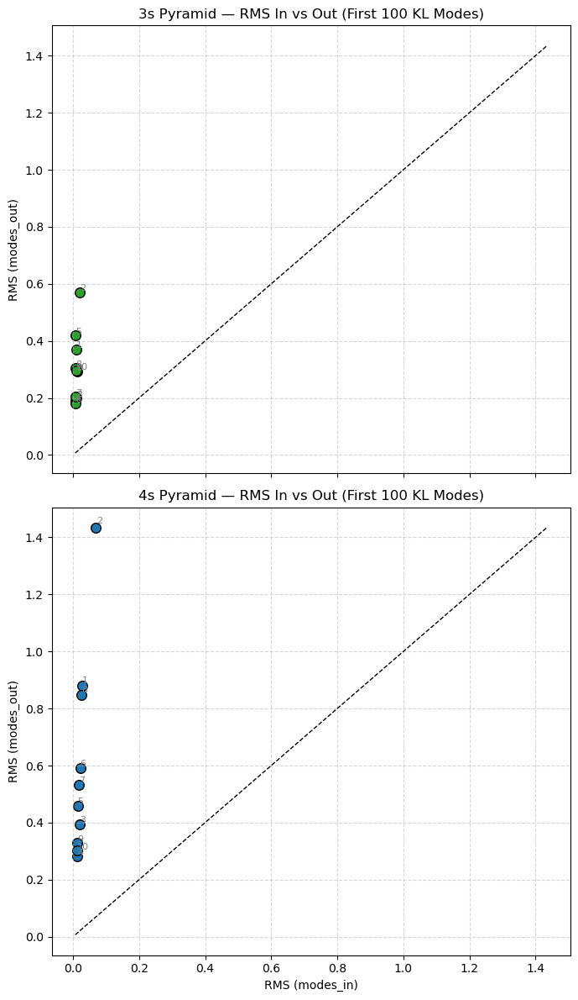

In [8]:
# --------------------------------------------------------------------
# Compute for both 3s and 4s pyramids
# --------------------------------------------------------------------
rms_in_3s, rms_out_3s, labels_3s = compute_rms_for_pyramid('3s')
rms_in_4s, rms_out_4s, labels_4s = compute_rms_for_pyramid('4s')

# --------------------------------------------------------------------
# Construct RMS dataframe and rename it df_RMS
# --------------------------------------------------------------------
df_RMS = pd.DataFrame({
    'pyramid': ['3s'] * len(rms_in_3s) + ['4s'] * len(rms_in_4s),
    'RMS_in': rms_in_3s + rms_in_4s,
    'RMS_out': rms_out_3s + rms_out_4s,
    'label': labels_3s + labels_4s
})

# Axis limits shared for visual consistency
min_lim = min(rms_in_3s + rms_out_3s + rms_in_4s + rms_out_4s)
max_lim = max(rms_in_3s + rms_out_3s + rms_in_4s + rms_out_4s)

# --------------------------------------------------------------------
# Plot: stacked (3s on top, 4s below)
# --------------------------------------------------------------------
fig, axes = plt.subplots(2, 1, figsize=(7, 12), sharex=True, sharey=True)

# --- 3s pyramid ---
ax = axes[0]
ax.scatter(rms_in_3s, rms_out_3s, s=70, color='tab:green', edgecolor='k')
for i, lbl in enumerate(labels_3s):
    ax.text(rms_in_3s[i]*1.01, rms_out_3s[i]*1.01, str(i+1), fontsize=8, color='gray')
ax.plot([min_lim, max_lim], [min_lim, max_lim], 'k--', lw=1)
ax.set_title('3s Pyramid — RMS In vs Out (First 100 KL Modes)')
ax.set_ylabel('RMS (modes_out)')
ax.grid(True, ls='--', alpha=0.5)

# --- 4s pyramid ---
ax = axes[1]
ax.scatter(rms_in_4s, rms_out_4s, s=70, color='tab:blue', edgecolor='k')
for i, lbl in enumerate(labels_4s):
    ax.text(rms_in_4s[i]*1.01, rms_out_4s[i]*1.01, str(i+1), fontsize=8, color='gray')
ax.plot([min_lim, max_lim], [min_lim, max_lim], 'k--', lw=1)
ax.set_title('4s Pyramid — RMS In vs Out (First 100 KL Modes)')
ax.set_xlabel('RMS (modes_in)')
ax.set_ylabel('RMS (modes_out)')
ax.grid(True, ls='--', alpha=0.5)

plt.tight_layout()
plt.show()


2025-10-02 02:27:34 | pyramid=3s | RMS=0.0087 | STD=0.0011
2025-10-02 02:27:46 | pyramid=4s | RMS=0.0202 | STD=0.0065
2025-10-02 02:32:36 | pyramid=3s | RMS=0.0160 | STD=0.0017
2025-10-02 02:32:58 | pyramid=4s | RMS=0.0466 | STD=0.0191
2025-10-02 02:33:47 | pyramid=3s | RMS=0.0077 | STD=0.0016
2025-10-02 02:34:00 | pyramid=4s | RMS=0.0148 | STD=0.0035
2025-10-02 02:36:37 | pyramid=3s | RMS=0.0057 | STD=0.0011
2025-10-02 02:36:51 | pyramid=4s | RMS=0.0102 | STD=0.0018
2025-10-02 02:37:57 | pyramid=3s | RMS=0.0068 | STD=0.0012
2025-10-02 02:38:21 | pyramid=4s | RMS=0.0104 | STD=0.0022
2025-10-02 03:10:56 | pyramid=3s | RMS=0.0063 | STD=0.0015
2025-10-02 03:11:10 | pyramid=4s | RMS=0.0143 | STD=0.0074
2025-10-02 03:12:37 | pyramid=3s | RMS=0.0054 | STD=0.0010
2025-10-02 03:13:19 | pyramid=4s | RMS=0.0119 | STD=0.0052
2025-10-02 03:27:19 | pyramid=3s | RMS=0.0066 | STD=0.0012
2025-10-02 03:30:43 | pyramid=4s | RMS=0.0177 | STD=0.0073
2025-10-03 00:46:36 | pyramid=3s | RMS=0.0096 | STD=0.00

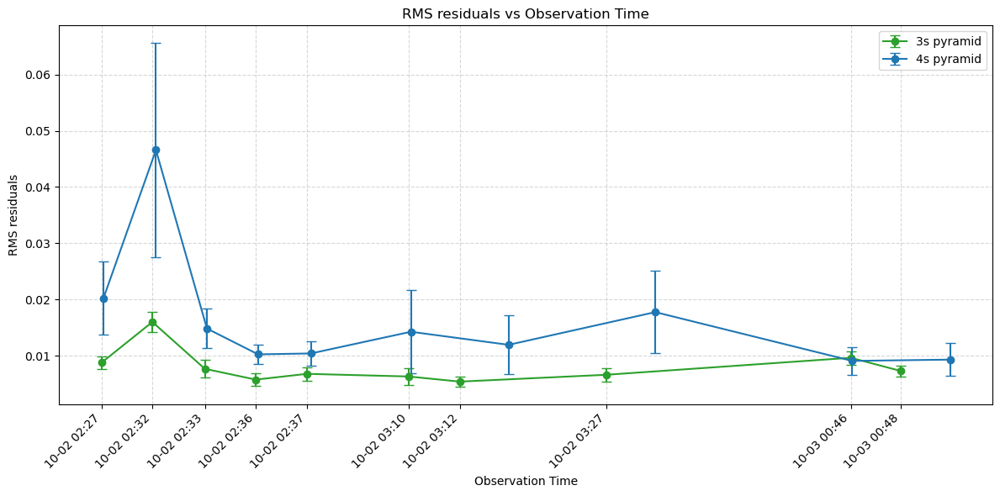

In [9]:
# --------------------------------------------------------------------
# Compute RMS of KL modes 
# --------------------------------------------------------------------
results = []

for folder in folders:
    try:
        pyramid = get_pyramid_type(folder)
        modes_in = fits.getdata(os.path.join(folder, 'modes_in.fits'))

        # rms over KL modes for each time step
        rms_modes_in = compute_modes_rms(modes_in[:, :])
        rms = np.mean(rms_modes_in)
        std = np.std(rms_modes_in)
        dt = get_datetime_from_path(folder)

        print(f"{dt} | pyramid={pyramid} | RMS={rms:.4f} | STD={std:.4f}")

        results.append({
            'datetime': dt,
            'pyramid': pyramid,
            'RMS': rms,
            'STD': std
        })

    except Exception as e:
        print(f"⚠️ Error in {folder}: {e}")

# --------------------------------------------------------------------
# Build compressed timeline 
# --------------------------------------------------------------------
df_RMS = pd.DataFrame(results).sort_values('datetime').reset_index(drop=True)
df_RMS['pair_index'] = np.floor(df_RMS.index / 2).astype(int) + 1
df_RMS['compressed_time'] = build_compressed_timeline(df_RMS)

# --------------------------------------------------------------------
# Tick labels (real datetimes from 3s pyramid only)
# --------------------------------------------------------------------
tick_locs = df_RMS[df_RMS['pyramid'] == '3s']['compressed_time']
tick_labels = [
    dt.strftime('%m-%d %H:%M') 
    for dt in df_RMS[df_RMS['pyramid'] == '3s']['datetime']
]

# --------------------------------------------------------------------
# Plot RMS vs Time (with error bars)
# --------------------------------------------------------------------
plt.figure(figsize=(12, 6))

for pyr, color in zip(['3s', '4s'], ['tab:green', 'tab:blue']):
    sub = df_RMS[df_RMS['pyramid'] == pyr]

    plt.errorbar(
        sub['compressed_time'], 
        sub['RMS'], 
        yerr=sub['STD'], 
        fmt='o-', 
        capsize=4,
        color=color, 
        label=f'{pyr} pyramid'
    )

plt.xlabel('Observation Time')
plt.ylabel('RMS residuals')
plt.title('RMS residuals vs Observation Time')
plt.grid(True, ls='--', alpha=0.5)
plt.legend()

plt.xticks(tick_locs, tick_labels, rotation=45, ha='right')
plt.tight_layout()
plt.savefig("RMS_residuals_vs_Time_new.png", dpi=300)
plt.show()


              datetime pyramid        EE     compressed_time       RMS  \
0  2025-10-02 02:27:34      3s  0.514791 2025-10-02 02:27:34  0.008743   
1  2025-10-02 02:27:46      4s  0.394104 2025-10-02 02:27:46  0.020230   
2  2025-10-02 02:32:36      3s  0.392606 2025-10-02 02:32:46  0.015993   
3  2025-10-02 02:32:58      4s  0.293361 2025-10-02 02:33:08  0.046577   
4  2025-10-02 02:33:47      3s  0.697060 2025-10-02 02:38:08  0.007661   
5  2025-10-02 02:34:00      4s  0.432838 2025-10-02 02:38:21  0.014822   
6  2025-10-02 02:36:37      3s  0.568033 2025-10-02 02:43:21  0.005739   
7  2025-10-02 02:36:51      4s  0.425143 2025-10-02 02:43:35  0.010234   
8  2025-10-02 02:37:57      3s  0.607551 2025-10-02 02:48:35  0.006766   
9  2025-10-02 02:38:21      4s  0.388059 2025-10-02 02:48:59  0.010391   
10 2025-10-02 03:10:56      3s  0.608239 2025-10-02 02:58:59  0.006294   
11 2025-10-02 03:11:10      4s  0.335521 2025-10-02 02:59:13  0.014250   
12 2025-10-02 03:12:37      3s  0.6308

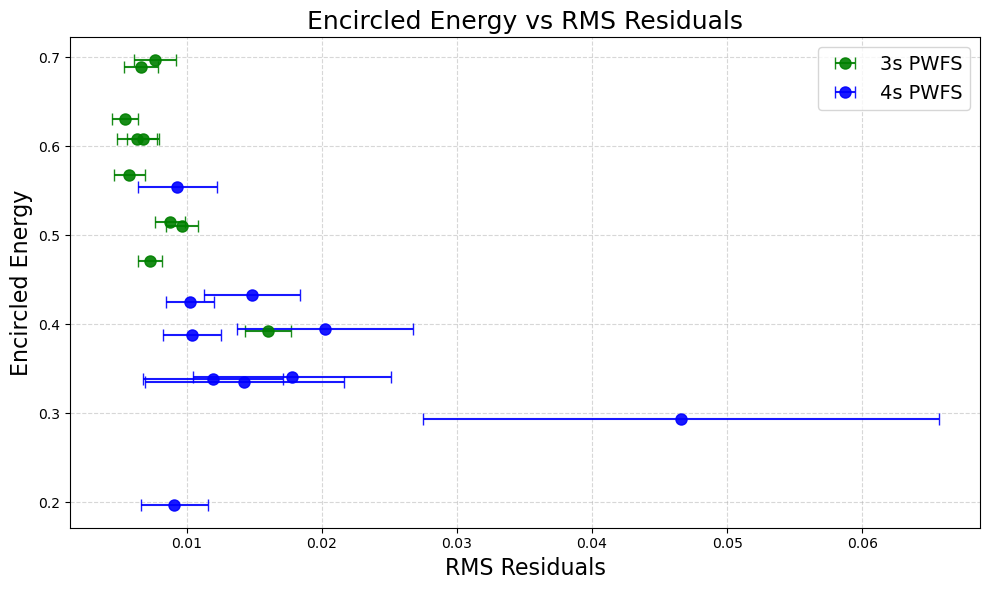

In [10]:
# ------------------------------------------------------------
# Merge the Encircled Energy and RMS results
# ------------------------------------------------------------
df_EE_clean = df_EE[['datetime', 'pyramid', 'EE', 'compressed_time']]
df_RMS_clean = df_RMS[['datetime', 'pyramid', 'RMS', 'STD', 'compressed_time']]

df_joint = pd.merge(
    df_EE_clean,
    df_RMS_clean,
    on=['datetime', 'pyramid', 'compressed_time']
)

# ------------------------------------------------------------
# Sort the merged table by datetime
# ------------------------------------------------------------
df_joint = df_joint.sort_values("datetime").reset_index(drop=True)

print(df_joint)

# ------------------------------------------------------------
# Plot Encircled Energy vs RMS 
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

colors = {
    '3s': 'green',
    '4s': 'blue'
}

for pyr in ['3s', '4s']:
    sub = df_joint[df_joint['pyramid'] == pyr]

    plt.errorbar(
        sub['RMS'], sub['EE'],
        xerr=sub['STD'],        # RMS error bars horizontally
        fmt='o', markersize=8,
        color=colors[pyr],
        label=f"{pyr} PWFS",
        alpha=0.9,
        capsize=4
    )

plt.xlabel("RMS Residuals", fontsize=16)
plt.ylabel("Encircled Energy", fontsize=16)
plt.title("Encircled Energy vs RMS Residuals", fontsize=18)
plt.grid(True, ls='--', alpha=0.5)
plt.legend(fontsize=14)
plt.tight_layout()

plt.savefig("EE_vs_RMS_new.png", dpi=300, transparent=True)
plt.show()


## Jitter

In [11]:
modes_out = fits.getdata(os.path.join(folder_data, 'modes_out.fits'))

jx_std = np.nanstd(modes_out[:, 0])
jy_std = np.nanstd(modes_out[:, 1])

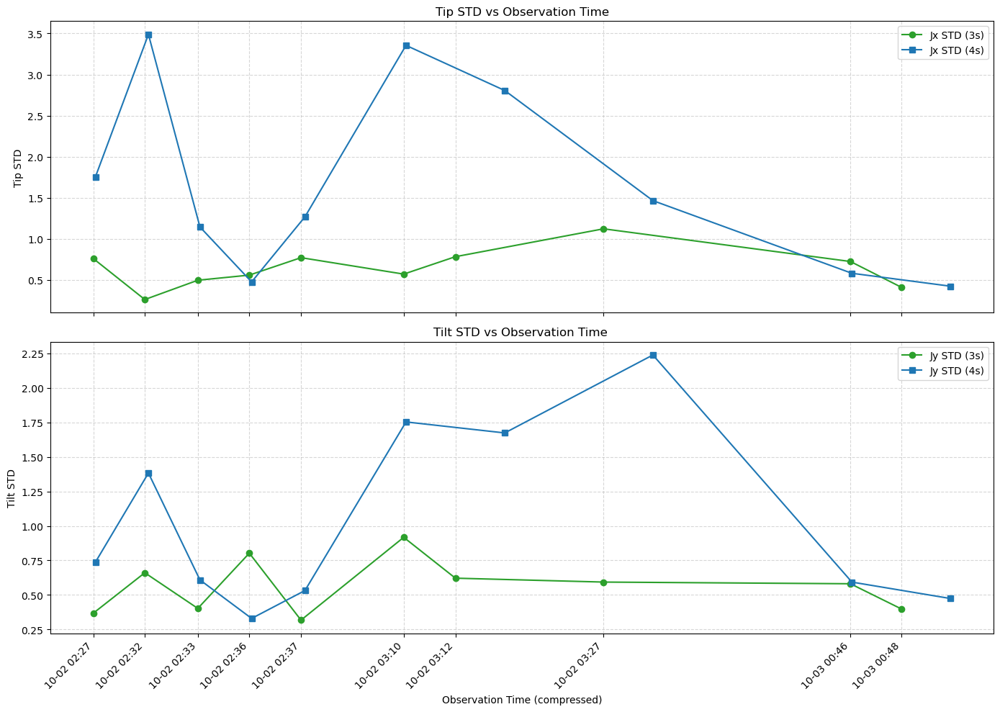

In [12]:
# --------------------------------------------------------------------
# Compute jitter std vs time
# --------------------------------------------------------------------
results = []
for folder in folders:
    try:
        pyramid = get_pyramid_type(folder)
        modes_out = fits.getdata(os.path.join(folder, 'modes_out.fits'))

        jx = modes_out[:, 0]
        jy = modes_out[:, 1]
        
        jx_std = np.nanstd(jx)
        jy_std = np.nanstd(jy)

        dt = get_datetime_from_path(folder)

        results.append({
            'datetime': dt,
            'pyramid': pyramid,
            'jx_std': jx_std,
            'jy_std': jy_std
        })

    except Exception as e:
        print(f"⚠️ Error in {folder}: {e}")


# --------------------------------------------------------------------
# Build compressed timeline 
# --------------------------------------------------------------------
df_jitter_modes = (
    pd.DataFrame(results)
    .sort_values('datetime')
    .reset_index(drop=True)
)
df_jitter_modes['compressed_time'] = build_compressed_timeline(df_jitter_modes)

# --------------------------------------------------------------------
# Tick labels – based on 3s pyramid only (clean timeline)
# --------------------------------------------------------------------
tick_locs = df_jitter_modes[df_jitter_modes['pyramid'] == '3s']['compressed_time']
tick_labels = [
    dt.strftime('%m-%d %H:%M')
    for dt in df_jitter_modes[df_jitter_modes['pyramid'] == '3s']['datetime']
]

# --------------------------------------------------------------------
# Plot: Jx STD (top) and Jy STD (bottom)
# --------------------------------------------------------------------
fig, axes = plt.subplots(2, 1, figsize=(14, 10), sharex=True)

# --- Jx STD ---
for pyr, marker, color in zip(['3s', '4s'], ['o', 's'], ['tab:green', 'tab:blue']):
    sub = df_jitter_modes[df_jitter_modes['pyramid'] == pyr]
    axes[0].plot(sub['compressed_time'], sub['jx_std'], marker+'-', 
                 label=f'Jx STD ({pyr})', color=color)

axes[0].set_ylabel('Tip STD')
axes[0].set_title('Tip STD vs Observation Time')
axes[0].grid(True, ls='--', alpha=0.5)
axes[0].legend()

# --- Jy STD ---
for pyr, marker, color in zip(['3s', '4s'], ['o', 's'], ['tab:green', 'tab:blue']):
    sub = df_jitter_modes[df_jitter_modes['pyramid'] == pyr]
    axes[1].plot(sub['compressed_time'], sub['jy_std'], marker+'-', 
                 label=f'Jy STD ({pyr})', color=color)

axes[1].set_ylabel('Tilt STD')
axes[1].set_title('Tilt STD vs Observation Time ')
axes[1].grid(True, ls='--', alpha=0.5)
axes[1].legend()

plt.xticks(tick_locs, tick_labels, rotation=45, ha='right')
plt.xlabel("Observation Time (compressed)")

plt.tight_layout()
plt.show()


              datetime      date pyramid  px_std  py_std  cx_std  cy_std
0  2025-10-02 02:27:34  01.10.25      3s  0.8998  0.7526  0.7993  0.5816
1  2025-10-02 02:27:46  01.10.25      4s  0.3666  0.6499  0.2296  0.5784
2  2025-10-02 02:32:36  01.10.25      3s  1.6608  0.7526  0.4388  0.3314
3  2025-10-02 02:32:58  01.10.25      4s  1.0583  2.1541  0.3806  0.8501
4  2025-10-02 02:33:47  01.10.25      3s  0.4964  0.4800  0.3725  0.3425
5  2025-10-02 02:34:00  01.10.25      4s  0.4800  0.4899  0.1874  0.3478
6  2025-10-02 02:36:37  01.10.25      3s  0.1960  0.0000  0.1722  0.1770
7  2025-10-02 02:36:51  01.10.25      4s  0.0000  0.1960  0.0833  0.1462
8  2025-10-02 02:37:57  01.10.25      3s  0.8523  0.6400  0.5846  0.4455
9  2025-10-02 02:38:21  01.10.25      4s  0.1960  0.4899  0.1393  0.1864
10 2025-10-02 03:10:56  01.10.25      3s  0.4000  0.3842  0.3329  0.2076
11 2025-10-02 03:11:10  01.10.25      4s  0.7236  0.8727  0.5287  0.6055
12 2025-10-02 03:12:37  01.10.25      3s  0.1795  0

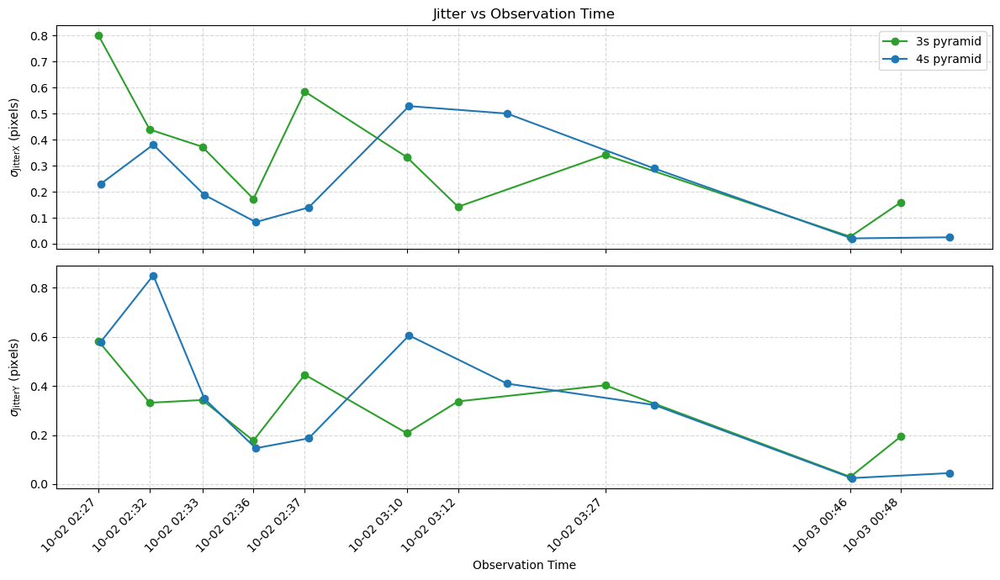

In [13]:
# --------------------------------------------------------------------
# First-level cropping (common for both pyramids)
# --------------------------------------------------------------------
crop_common = {
    '30.09.25': dict(y0=220, y1=320, x0=275, x1=375),
    '01.10.25': dict(y0=200, y1=400, x0=225, x1=425),
    '02.10.25': dict(y0=220, y1=320, x0=285, x1=385),
}

# --------------------------------------------------------------------
# Second-level cropping (relative to the first)
# --------------------------------------------------------------------
crop_inner = {
    "3s": {
        "30.09.25": dict(y0=44, y1=74, x0=35, x1=65),
        "01.10.25": dict(y0=60, y1=90, x0=85, x1=115),
        "02.10.25": dict(y0=40, y1=70, x0=30, x1=60),
    },
    "4s": {
        "30.09.25": dict(y0=30, y1=60, x0=40, x1=70),
        "01.10.25": dict(y0=52, y1=82, x0=88, x1=118),
        "02.10.25": dict(y0=35, y1=65, x0=36, x1=66),
    },
}

# --------------------------------------------------------------------
# Main computation
# --------------------------------------------------------------------
results = []

for folder in folders:
    pyr = get_pyramid_type(folder)
    date = get_date_from_path(folder)
    dt = get_datetime_from_path(folder)

    try:
        # --- Load cube ---
        cube = fits.getdata(os.path.join(folder, "cred2.fits")).astype(float)

        # --- 1st-level crop (common window) ---
        c1 = crop_common[date]
        subcube = cube[:, c1['y0']:c1['y1'], c1['x0']:c1['x1']]

        # --- 2nd-level crop ---
        c2 = crop_inner[pyr][date]
        psf_data = subcube[:, c2['y0']:c2['y1'], c2['x0']:c2['x1']]

        # --- Compute frame-by-frame positions ---
        N = psf_data.shape[0]
        peak_x, peak_y, com_x, com_y = np.empty(N), np.empty(N), np.empty(N), np.empty(N)

        for i in range(N):
            img = psf_data[i]
            ypk, xpk = np.unravel_index(np.argmax(img), img.shape)
            ycm, xcm = center_of_mass(img**5)
            peak_x[i], peak_y[i], com_x[i], com_y[i] = xpk, ypk, xcm, ycm

        # --- Standard deviations ---
        px_std = np.nanstd(peak_x)
        py_std = np.nanstd(peak_y)
        cx_std = np.nanstd(com_x)
        cy_std = np.nanstd(com_y)

        results.append(dict(
            datetime=dt, date=date, pyramid=pyr,
            px_std=px_std, py_std=py_std,
            cx_std=cx_std, cy_std=cy_std
        ))

    except Exception as e:
        print(f"❌ Error in {folder}: {e}")


# --------------------------------------------------------------------
# Summary table — RENAME HERE
# --------------------------------------------------------------------
df_jitter_psf = (
    pd.DataFrame(results)
    .sort_values("datetime")
    .reset_index(drop=True)
)
print(df_jitter_psf.round(4))

# --------------------------------------------------------------------
# Build compressed timeline 
# --------------------------------------------------------------------
df_jitter_psf['compressed_time'] = build_compressed_timeline(df_jitter_psf)


# --------------------------------------------------------------------
# Tick labels – based on 3s pyramid only
# --------------------------------------------------------------------
tick_locs = df_jitter_psf[df_jitter_psf['pyramid'] == '3s']['compressed_time']
tick_labels = [
    dt.strftime('%m-%d %H:%M') 
    for dt in df_jitter_psf[df_jitter_psf['pyramid'] == '3s']['datetime']
]

# --------------------------------------------------------------------
# Plot cx_std and cy_std vs time
# --------------------------------------------------------------------
fig, ax = plt.subplots(2, 1, figsize=(12, 7), sharex=True)

# ---- cx_std ----
for pyr, color in zip(['3s', '4s'], ['tab:green', 'tab:blue']):
    sub = df_jitter_psf[df_jitter_psf['pyramid'] == pyr]
    ax[0].plot(sub['compressed_time'], sub['cx_std'], 'o-', 
               color=color, label=f'{pyr} pyramid')

ax[0].set_ylabel(r'$\sigma_{\mathrm{JitterX}}\ (\mathrm{pixels})$')
ax[0].set_title('Jitter vs Observation Time')
ax[0].grid(True, ls='--', alpha=0.5)
ax[0].legend()

# ---- cy_std ----
for pyr, color in zip(['3s', '4s'], ['tab:green', 'tab:blue']):
    sub = df_jitter_psf[df_jitter_psf['pyramid'] == pyr]
    ax[1].plot(sub['compressed_time'], sub['cy_std'], 'o-', 
               color=color, label=f'{pyr} pyramid')

ax[1].set_ylabel(r'$\sigma_{\mathrm{JitterY}}\ (\mathrm{pixels})$')
ax[1].set_xlabel('Observation Time')
ax[1].grid(True, ls='--', alpha=0.5)

plt.xticks(tick_locs, tick_labels, rotation=45, ha='right')
plt.tight_layout()
plt.show()



# Loop rate

In [14]:
# ------------------------------------------------------------
# Compute loop rate per observation (NO loop_results df)
# ------------------------------------------------------------
loop_list = []   # just a list, not a dataframe

for folder in folders:
    try:
        ts = fits.getdata(os.path.join(folder, 'modes_in_ts.fits')).squeeze()
        ts_diff = np.diff(np.asarray(ts))
        loop_rate = np.nanmedian(ts_diff)   # seconds per AO loop

        dt = get_datetime_from_path(folder)

        loop_list.append({
            'datetime': dt,
            'loop_rate': loop_rate
        })

    except Exception as e:
        print(f"⚠️ No loop rate for {folder}: {e}")
        
df_loop_rate = pd.DataFrame(loop_list)


In [15]:
# ------------------------------------------------------------
# Build final summary table (df_all)
# ------------------------------------------------------------

EE_tab        = df_EE[['datetime', 'pyramid', 'EE']]      # <-- include pyramid here
FWHM_tab      = df_fwhm[['datetime', 'FWHM_geom']]
RMS_tab       = df_RMS[['datetime', 'RMS', 'STD']]
JITTER_tab    = df_jitter_psf[['datetime', 'cx_std', 'cy_std']]
JITTER_modes_tab = df_jitter_modes[['datetime', 'jx_std', 'jy_std']]
LOOP_tab      = df_loop_rate[['datetime', 'loop_rate']]

df_all = (
    EE_tab
    .merge(FWHM_tab, on='datetime')
    .merge(RMS_tab, on='datetime')
    .merge(JITTER_tab, on='datetime')
    .merge(JITTER_modes_tab, on='datetime')
    .merge(LOOP_tab, on='datetime')
)

df_all['date_obs'] = df_all['datetime'].dt.strftime('%Y-%m-%d_%H-%M-%S')

df_all = df_all[
    [
        'date_obs',
        'pyramid',       # <-- NEW COLUMN
        'EE',
        'FWHM_geom',
        'RMS',
        'STD',
        'cx_std',
        'cy_std',
        'jx_std',
        'jy_std',
        'loop_rate'
    ]
]

df_all = df_all.sort_values("date_obs").reset_index(drop=True)

print(df_all.round(4))

df_all.to_csv("df_3s_vs_4s_new.csv", index=False)
print("Saved df_all.csv")

               date_obs pyramid      EE  FWHM_geom     RMS     STD  cx_std  \
0   2025-10-02_02-27-34      3s  0.5148     2.1900  0.0087  0.0011  0.7993   
1   2025-10-02_02-27-46      4s  0.3941     2.9414  0.0202  0.0065  0.2296   
2   2025-10-02_02-32-36      3s  0.3926     2.2596  0.0160  0.0017  0.4388   
3   2025-10-02_02-32-58      4s  0.2934     4.1306  0.0466  0.0191  0.3806   
4   2025-10-02_02-33-47      3s  0.6971     1.9054  0.0077  0.0016  0.3725   
5   2025-10-02_02-34-00      4s  0.4328     2.3051  0.0148  0.0035  0.1874   
6   2025-10-02_02-36-37      3s  0.5680     2.6026  0.0057  0.0011  0.1722   
7   2025-10-02_02-36-51      4s  0.4251     2.9244  0.0102  0.0018  0.0833   
8   2025-10-02_02-37-57      3s  0.6076     1.8952  0.0068  0.0012  0.5846   
9   2025-10-02_02-38-21      4s  0.3881     3.1742  0.0104  0.0022  0.1393   
10  2025-10-02_03-10-56      3s  0.6082     1.9024  0.0063  0.0015  0.3329   
11  2025-10-02_03-11-10      4s  0.3355     4.1616  0.0143  0.00